In [45]:
import pygmt

In [46]:
dem_2009 = "lidarData/usace2009_gulf_dem_J1009883.tif"
dem_2018 = "lidarData/tx2018_coast_dem_J1009861.tif"
dem_2001 = "lidarData/2001_TX_Harris_Job1009885.tif"

dem = "lidarData/2001_TX_Harris_Job1009047.tif"

In [100]:
import rasterio
import pandas as pd

# Path to the DEM GeoTIFF file
dem_2001_path = "lidarData/2001_TX_Harris_Job1009885.tif"

# Open the DEM GeoTIFF file using rasterio
with rasterio.open(dem_2001_path) as src:
    # Get the spatial transformation (affine transformation matrix)
    transform = src.transform

    # Get the pixel coordinates for the center of the raster
    nrows, ncols = src.height, src.width
    center_pixel = (ncols // 2, nrows // 2)

    # Convert the pixel coordinates to geographic coordinates (latitude and longitude)
    lon, lat = src.xy(center_pixel[0], center_pixel[1])

# Create a DataFrame with latitude and longitude values
data = {
    'latitude': [lat],
    'longitude': [lon]
}
df = pd.DataFrame(data)

# Print the latitude and longitude values
print("Latitude:", lat)
print("Longitude:", lon)

Latitude: 29.755434514070423
Longitude: -95.03204706620029


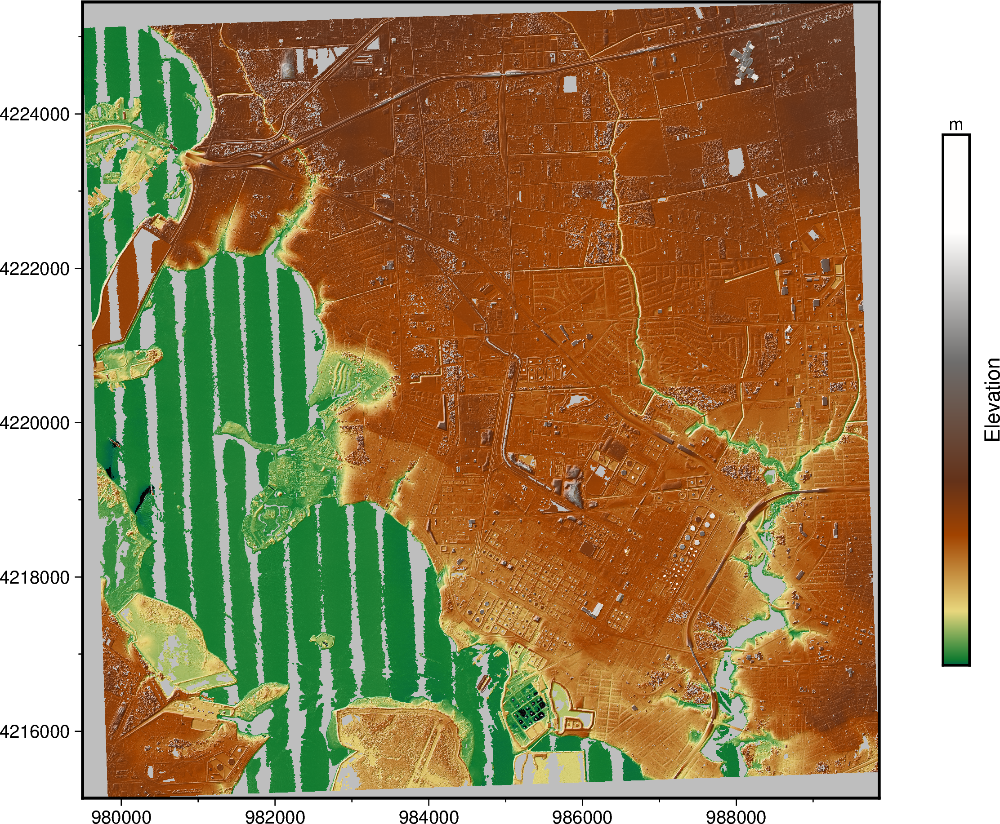

In [61]:
# Plot DEM and frame
fig = pygmt.Figure()
fig.grdimage(grid=dem, cmap="geo", shading=True, frame=True)
fig.colorbar(frame=["a1000", "x+lElevation", "y+lm"], position="JMR+o1.2c/0c+w10c/0.5c")
fig.show()

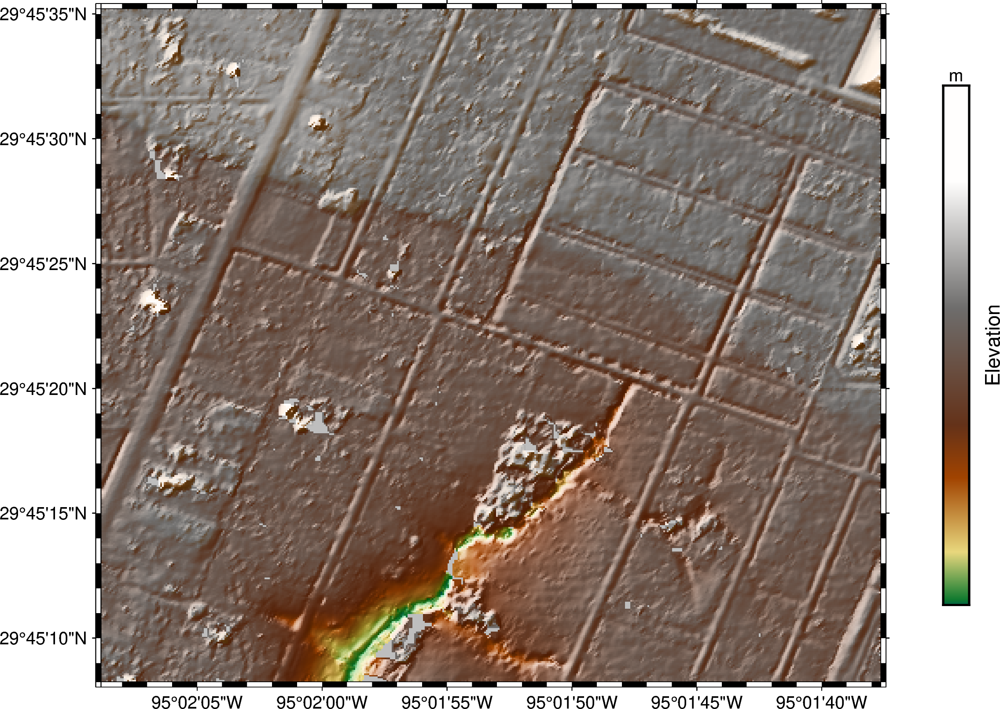

In [62]:
# Plot DEM and frame
fig = pygmt.Figure()
dem_2001 = "lidarData/2001_TX_Harris_Job1009885.tif"
fig.grdimage(grid=dem_2001, cmap="geo", shading=True, frame=True)
fig.colorbar(frame=["a1000", "x+lElevation", "y+lm"], position="JMR+o1.2c/0c+w10c/0.5c")
fig.show()

In [106]:
file_path = "lidarData/wooster_fault_2018.xyz"

# Read the XYZ file using pandas
df = pd.read_csv(file_path, delimiter=",", header=1, names=["longitude", "latitude", "elevation"])
df


,longitude,latitude,elevation
0,-95.032,29.756,6.20
1,-95.032,29.756,6.21
2,-95.032,29.756,6.21
3,-95.032,29.756,6.20
4,-95.032,29.756,6.21
...,...,...,...
574455,-95.031,29.758,7.29
574456,-95.031,29.758,7.31
574457,-95.031,29.758,7.28
574458,-95.031,29.758,7.29


In [178]:
pip install geopandas

     ---------------------------------------- 0.0/51.5 kB ? eta -:--:--
     --------------- ---------------------- 20.5/51.5 kB 320.0 kB/s eta 0:00:01
     -------------------------------------- 51.5/51.5 kB 655.5 kB/s eta 0:00:00
   ---------------------------------------- 0.0/1.1 MB ? eta -:--:--
   ------------ --------------------------- 0.3/1.1 MB 10.9 MB/s eta 0:00:01
   ---------------------------------------- 1.1/1.1 MB 14.1 MB/s eta 0:00:00
   ---------------------------------------- 0.0/22.9 MB ? eta -:--:--
   - -------------------------------------- 0.8/22.9 MB 25.4 MB/s eta 0:00:01
   ---- ----------------------------------- 2.4/22.9 MB 30.6 MB/s eta 0:00:01
   ------- -------------------------------- 4.3/22.9 MB 34.0 MB/s eta 0:00:01
   --------- ------------------------------ 5.6/22.9 MB 32.9 MB/s eta 0:00:01
   ------------ --------------------------- 7.2/22.9 MB 32.8 MB/s eta 0:00:01
   -------------- ------------------------- 8.5/22.9 MB 32.1 MB/s eta 0:00:01
   ----

In [185]:
from pyproj import Proj, transform

def xyz_to_latlon(x, y, z):
    # Define the projection for XYZ coordinates
    proj_xyz = Proj(proj='geocent', ellps='WGS84', datum='WGS84')

    # Define the projection for latitude and longitude
    proj_latlon = Proj(proj='latlong', ellps='WGS84', datum='WGS84')

    # Convert XYZ coordinates to latitude, longitude, and altitude
    lon, lat, alt = transform(proj_xyz, proj_latlon, x, y, z, radians=False)

    return lat, lon

# Example XYZ coordinates
x = -485929.0942
y = -5520269.9336
z = 3147085.1902

# Convert XYZ coordinates to latitude and longitude
latitude, longitude = xyz_to_latlon(x, y, z)
print("Latitude:", latitude)
print("Longitude:", longitude)


Latitude: 29.757797202339038
Longitude: -95.03057049417531


C:\Users\Sagar\AppData\Local\Temp\ipykernel_28084\3767977784.py:11: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotchas.html#upgrading-to-pyproj-2-from-pyproj-1
  lon, lat, alt = transform(proj_xyz, proj_latlon, x, y, z, radians=False)


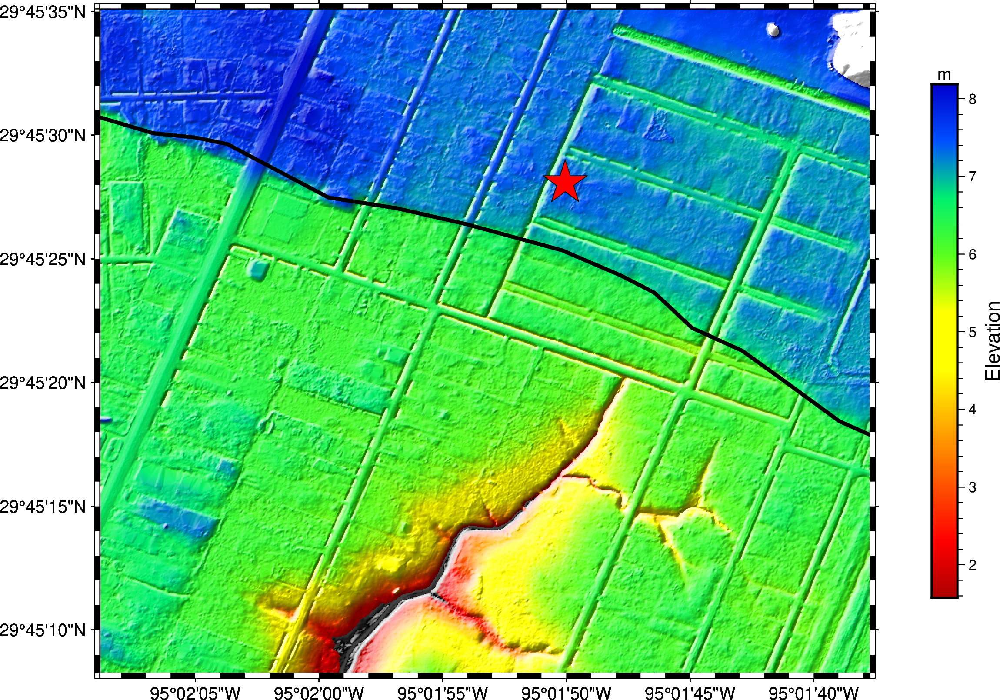

In [186]:
# Plot DEM and frame
import pandas as pd
fig = pygmt.Figure()
fig.grdimage(grid=dem_2018, cmap="seis", shading=True, frame=True)
fig.colorbar(frame=["x+lElevation", "y+lm"],cmap=True,position="JMR+o1.2c/0c+w10c/0.5c")
fig.plot(x=-95.03057049417531,y=29.757797202339038,style="a0.9c", fill="red", pen="black")
fig.plot(data="lidarData/baytown_fault.shp",pen="2p,black")
fig.basemap(frame="af")
fig.show()


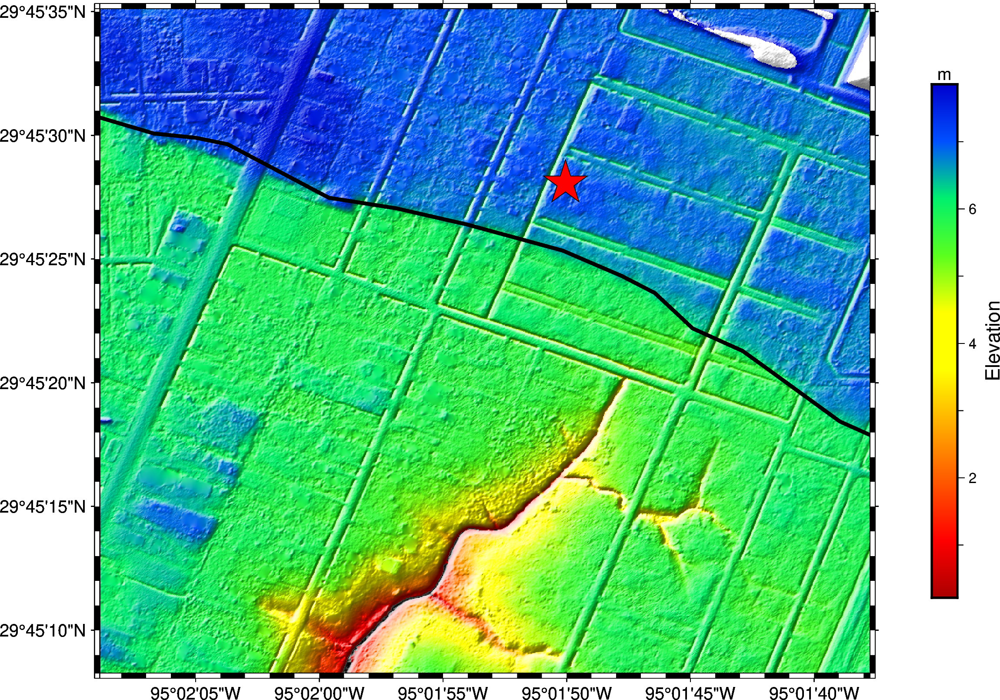

In [189]:
# Plot DEM and frame
import pandas as pd
fig = pygmt.Figure()


fig.grdimage(grid=dem_2009, cmap="seis", shading=True, frame=True)

fig.colorbar(frame=["x+lElevation", "y+lm"],cmap=True,position="JMR+o1.2c/0c+w10c/0.5c")
fig.plot(x=-95.03057049417531,y=29.757797202339038,style="a0.9c", fill="red", pen="black")
fig.plot(data="lidarData/baytown_fault.shp",pen="2p,black")
fig.basemap(frame="af")
fig.show()

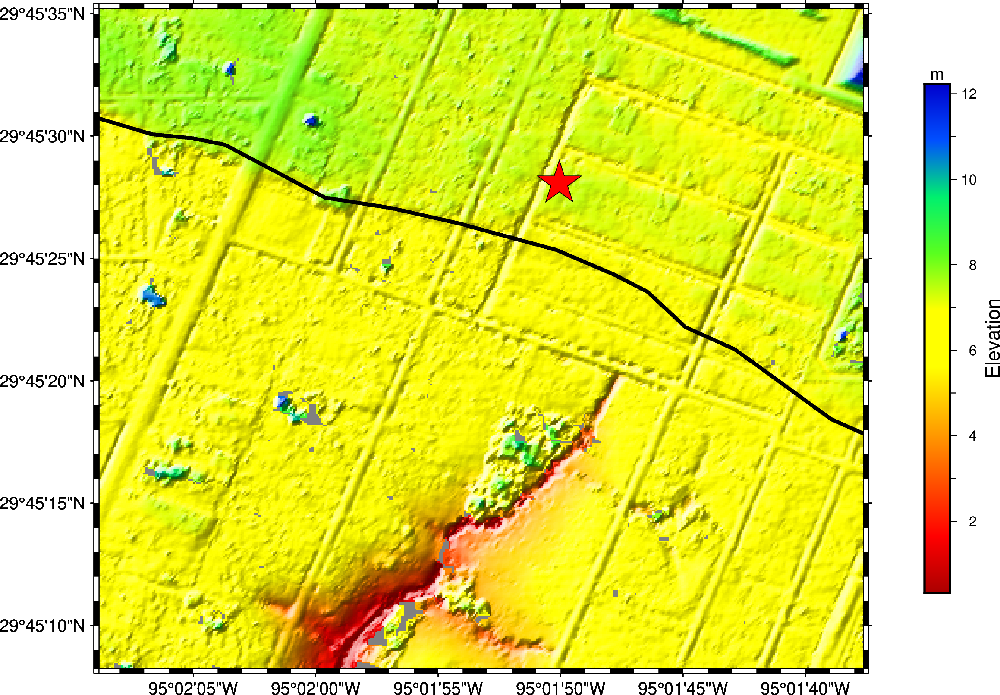

In [190]:
# Plot DEM and frame
import pandas as pd
fig = pygmt.Figure()


fig.grdimage(grid=dem_2001, cmap="seis", shading=True, frame=True)

fig.colorbar(frame=["x+lElevation", "y+lm"],cmap=True,position="JMR+o1.2c/0c+w10c/0.5c")
fig.plot(x=-95.03057049417531,y=29.757797202339038,style="a0.9c", fill="red", pen="black")
fig.plot(data="lidarData/baytown_fault.shp",pen="2p,black")
fig.basemap(frame="af")
fig.show()